In [ ]:
import matplotlib.pyplot as plt
from scipy.io import wavfile
import argparse
import os
from glob import glob
import numpy as np
import pandas as pd
from librosa.core import resample, to_mono
from tqdm import tqdm
from pathlib import Path
import librosa
import librosa.display
from tqdm import tqdm_notebook as tqdm
from IPython.display import Audio, IFrame, display

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


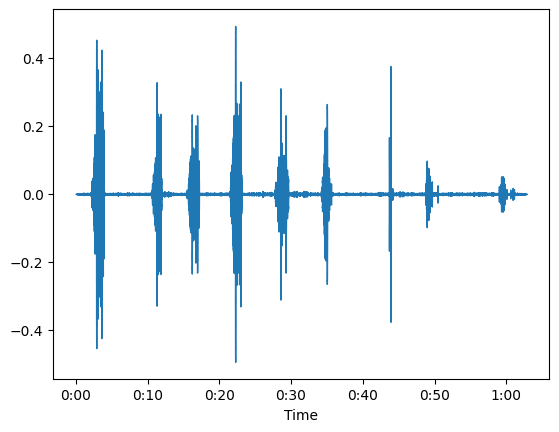

In [ ]:
# plot the waveform and the audio file
audio_path='/content/drive/MyDrive/sagspa1/XC147495.wav'
x , sr = librosa.load(audio_path)
librosa.display.waveshow(x, sr=sr)
Audio(x, rate=sr)

<ipython-input-5-20c053a3be79>:2: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(np.abs(S)) instead.
  env = librosa.amplitude_to_db(librosa.stft(x), ref=np.max)


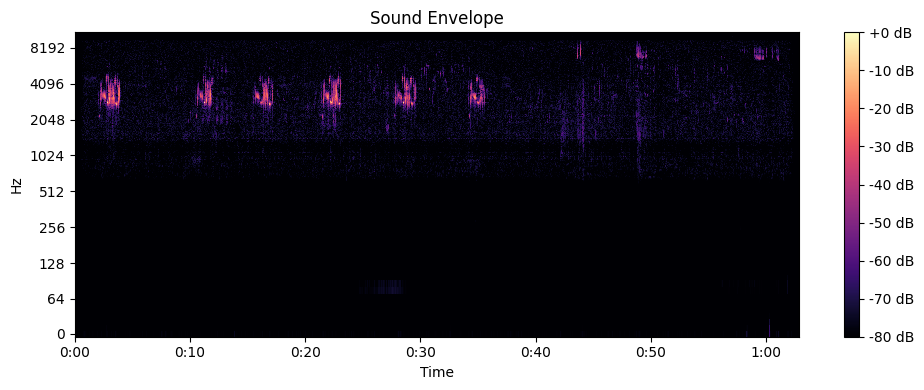

In [ ]:
# plot the sound envelope
env = librosa.amplitude_to_db(librosa.stft(x), ref=np.max)
plt.figure(figsize=(10, 4))
librosa.display.specshow(env, y_axis='log', x_axis='time')
plt.title('Sound Envelope')
plt.colorbar(format='%+2.0f dB')
plt.tight_layout()
plt.show()

In [ ]:
# define the function to use rolling window to calculate waveform mask 
def envelope(y, rate, threshold):
    mask = []
    y = pd.Series(y).apply(np.abs)
    y_mean = y.rolling(window=int(rate/20),min_periods=1,center=True).max()
    for mean in y_mean:
        if mean > threshold:
            mask.append(True)
        else:
            mask.append(False)
    return mask, y_mean

In [ ]:
# define the function to downsample the waveform if necessary
def downsample_mono(path, sr):
    rate, wav = wavfile.read(path)
    wav = wav.astype(np.float32, order='F')
    try:
        tmp = wav.shape[1]
        wav = to_mono(wav.T)
    except:
        pass
    wav = resample(wav, orig_sr=rate, target_sr=sr)
    wav = wav.astype(np.int16)
    return sr, wav

In [ ]:
# define the function to process the audiofile, do the downsample and apply the mask
def test_threshold(args):
    src_root = args.src_root
    audio_path='/content/drive/MyDrive/sagspa1/XC147495.wav'
    x , sr = librosa.load(audio_path)
    rate, wav = downsample_mono(audio_path, sr)
    mask, env = envelope(wav, rate, threshold=args.threshold)
    fig = plt.figure(figsize=(30, 30))
    ax1 = fig.add_subplot(211)
    ax2 = fig.add_subplot(212)
    
    plt.style.use('ggplot')
    plt.title('Signal Envelope, Threshold = {}'.format(str(args.threshold)))
    
    ax1.plot(wav, color='g', label='original')
    ax1.set_title('Original Audio from Tape Recorder',fontsize=30)
    ax2.plot(env, color='y', label='envelope')
    ax2.plot(wav[mask], color='c', label='keep')
    ax2.plot(wav[np.logical_not(mask)], color='r', label='remove')
    ax2.legend(loc='best',fontsize=30)
    ax2.set_title('Processed Audio',fontsize=30)
    plt.show()
    print("Original- Tape Recoder Audio")
    display(Audio(wav, rate=rate))
    print("Noise(removed)- Red")
    display(Audio(wav[np.logical_not(mask)], rate=sr))
    print("Pure Bird Call(saved)- Blue")
    display(Audio(wav[mask], rate=rate))

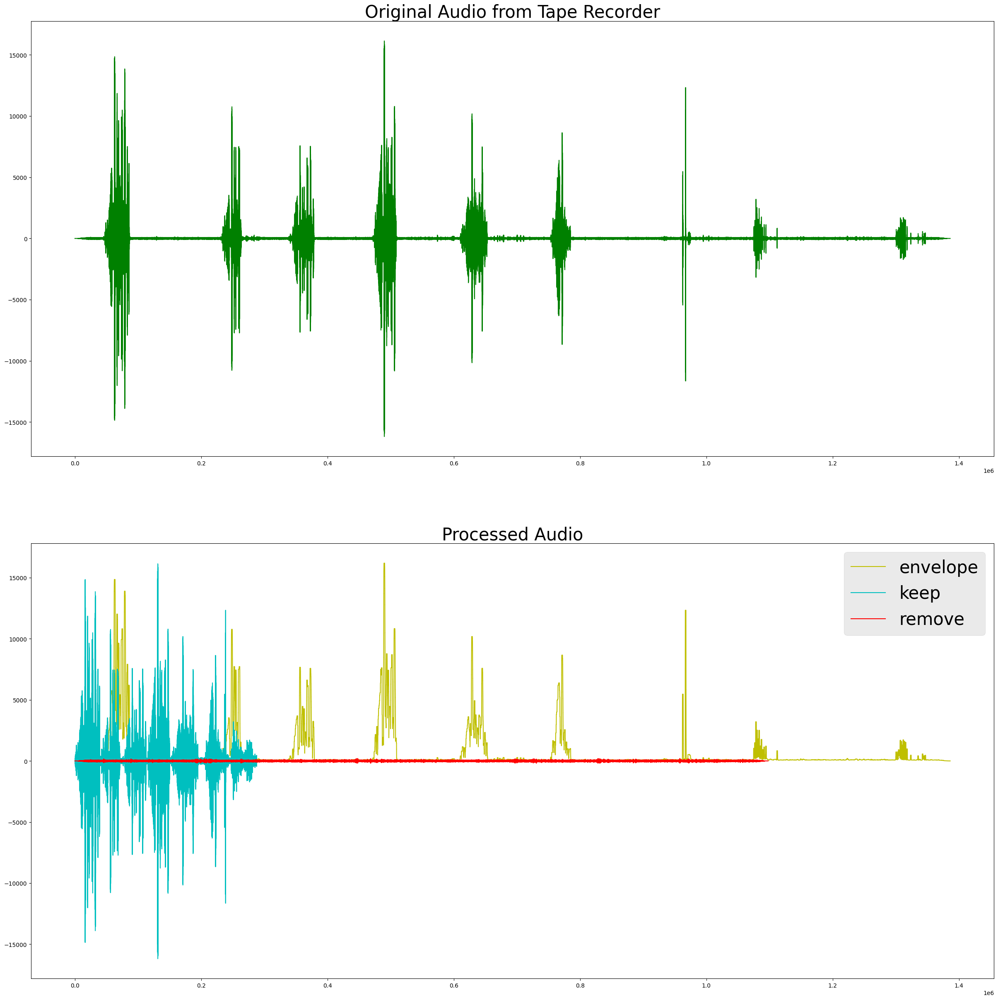

Original- Tape Recoder Audio


Noise(removed)- Red


Pure Bird Call(saved)- Blue


In [ ]:
# main function
if __name__ == '__main__':

    parser = argparse.ArgumentParser(description='Cleaning audio data')
    parser.add_argument('--src_root', type=str, default='C:/Users/Jade/Downloads/sagspa1/XC205476.wav',
                        help='directory of audio files in total duration')
    parser.add_argument('--dst_root', type=str, default='clean',
                        help='directory to put audio files split by delta_time')
    parser.add_argument('--delta_time', '-dt', type=float, default=1.0,
                        help='time in seconds to sample audio')
    parser.add_argument('--sr', type=int, default=16000,
                        help='rate to downsample audio')

    parser.add_argument('--fn', type=str, default='XC147495',
                        help='file to plot over time to check magnitude')
    parser.add_argument('--threshold', type=str, default=200,
                        help='threshold magnitude for np.int16 dtype')
    args, _ = parser.parse_known_args()

    test_threshold(args)

In [ ]:
folder_path = "/content/drive/MyDrive/sagspa1"

4.4719506331654255
49.71977119731023
6.529708694726972
0.2140787223288271
4.296600579893348
0.5872972553896336
8.865468985064421
-3.73901104676433
4.761460755994871
6.479501788055515
0.36045962634370676
3.5011268326341427
6.634995720942499
5.630464834361368
13.802259072861924
15.961892936225283
6.20821155796794
8.81420765811457
8.636226241634379
0.6333287730921175
62.854035918685526
0.7603124544698074
2.5587742420661614


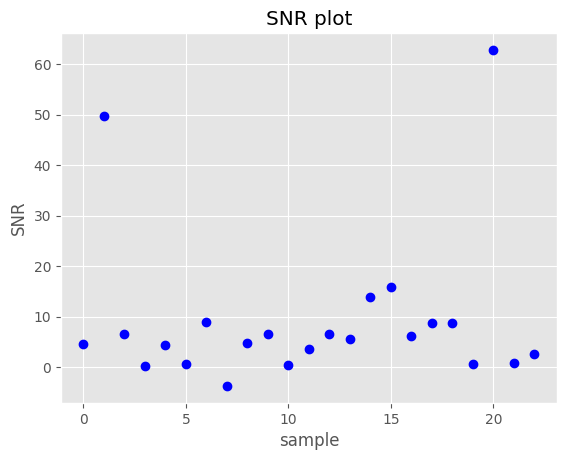

In [ ]:
snrs = []
for filename in os.listdir(folder_path):
  if filename.endswith(".wav"):
    audio_path = os.path.join(folder_path, filename)
    x , sr = librosa.load(audio_path)
    rate, wav = downsample_mono(audio_path, sr)
    mask, env = envelope(wav, rate, threshold=args.threshold)
    
    noise = wav[np.logical_not(mask)]
    if (len(noise) > 0):
      noise_power = np.sum(noise**2) / len(noise)
    
    signal = wav[mask]
    signal_power = np.sum(signal**2) / len(signal)
    
    if (noise_power > 0):
      snr =  10 * np.log10(signal_power / noise_power)
      snrs.append(snr)
      print(snr)

plt.plot(snrs, 'bo')
plt.xlabel('sample')
plt.ylabel('SNR')
plt.title('SNR plot')

plt.show()
    

In [ ]:
print(np.mean(snrs))

9.50187493193758
